# **AT1 - Análise Exploratória dos Dados (EDA)**
# Projeto de Eficiência Energética - UCI Energy Efficiency Dataset
**por Tiago Dutra Galvão**

**Primeiramente vamos realizar a importação das bibliotecas principais que iremos utilizar na EDA.**

In [76]:
# Importação das bibliotecas necessárias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

**Vamos configurar os parâmetros dos gráficos a serem gerados nas análises EDA.**

In [77]:
# Configurações de visualização
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12
pd.set_option('display.max_columns', None)

**Após esses ajustes iniciais, podemos montar um script para o carregamento do arquivo csv que contem os dados, nosso dataset de trabalho. É possível visualizar as 5 primeiras linhas do dataset, logo abaixo do script. Nota-se que temos duas colunas não nominadas e sem dados de interesse ao estudo (NAN - not a number, dados faltantes), desta forma devemos deletá-los do dataset.**

In [78]:
# Carregamento dos dados
# Ajuste o caminho do arquivo conforme necessário
data_path = '../../data/raw/ENB2012_data.csv'  # Ajuste o nome do arquivo conforme necessário

try:
    # Tentativa de carregar assumindo que os dados têm cabeçalho
    df = pd.read_csv(data_path, sep=';')
    print("Dados carregados com sucesso assumindo que há cabeçalho.")
except:
    try:
        # Se falhar, tentar carregar sem cabeçalho e definir nomes de colunas manualmente
        column_names = [
            'Relative_Compactness', 'Surface_Area', 'Wall_Area', 'Roof_Area',
            'Overall_Height', 'Orientation', 'Glazing_Area', 'Glazing_Area_Distribution',
            'Heating_Load', 'Cooling_Load'
        ]
        df = pd.read_csv(data_path, header=None, names=column_names)
        print("Dados carregados com sucesso sem cabeçalho.")
    except Exception as e:
        print(f"Erro ao carregar os dados: {e}")

# Exibir as primeiras linhas do DataFrame
print("\nPrimeiras 5 linhas do conjunto de dados:")
display(df.head())



Dados carregados com sucesso assumindo que há cabeçalho.

Primeiras 5 linhas do conjunto de dados:


,X1,X2,X3,X4,X5,X6,X7,X8,Y1,Y2,Unnamed: 10,Unnamed: 11
0,"0,98","514,50","294,00","110,25","7,00",2,"0,00",0,"15,55","21,33",NaN,NaN
1,"0,98","514,50","294,00","110,25","7,00",3,"0,00",0,"15,55","21,33",NaN,NaN
2,"0,98","514,50","294,00","110,25","7,00",4,"0,00",0,"15,55","21,33",NaN,NaN
3,"0,98","514,50","294,00","110,25","7,00",5,"0,00",0,"15,55","21,33",NaN,NaN
4,"0,90","563,50","318,50","122,50","7,00",2,"0,00",0,"20,84","28,28",NaN,NaN


**Aqui podemos tirar informações sobre nosso conjunto de dados como o número de amostras e de colunas e o tipo dos dados do ponto de vista de estrutura de dados. É possível notar, segundo a taebla de dados acima e as informações do conjunto de dados que a maior parte dos dados está no tipo de string, mas claramente são dados numéricos, como visto no dataset acima. Outro ponto importante, é que as casas decimais estão separadas por vírgulas (,) e devem estar separadas por pontos (.) para o melhor tratamento dos dados utilizando as funções matemáticas e estatísticas em Python. Sendo assim, devemos fazer essa alteração em nosso dataset posteriormente e antes da aplicação das ferramentas matemáticas de análise.**

In [79]:
# Informações sobre o DataFrame
print("\nInformações sobre o conjunto de dados:")
print(f"Número de amostras: {df.shape[0]}")
print(f"Número de colunas: {df.shape[1]}")
display(df.info())


Informações sobre o conjunto de dados:
Número de amostras: 768
Número de colunas: 12
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   X1           768 non-null    object 
 1   X2           768 non-null    object 
 2   X3           768 non-null    object 
 3   X4           768 non-null    object 
 4   X5           768 non-null    object 
 5   X6           768 non-null    int64  
 6   X7           768 non-null    object 
 7   X8           768 non-null    int64  
 8   Y1           768 non-null    object 
 9   Y2           768 non-null    object 
 10  Unnamed: 10  0 non-null      float64
 11  Unnamed: 11  0 non-null      float64
dtypes: float64(2), int64(2), object(8)
memory usage: 72.1+ KB


None

**Aqui geramos um script para a remoção das colunas nominadas 10 e 11 com dados faltantes, elas não representam nenhuma informação relevante dos dados em nosso dataset.**

In [80]:
# Remover colunas vazias
unnamed_cols = [col for col in df.columns if 'Unnamed' in col]
if unnamed_cols:
    print(f"\nRemovendo as seguintes colunas vazias: {unnamed_cols}")
    df = df.drop(columns=unnamed_cols)
    print(f"Dimensões do DataFrame após remover colunas vazias: {df.shape}")


Removendo as seguintes colunas vazias: ['Unnamed: 10', 'Unnamed: 11']
Dimensões do DataFrame após remover colunas vazias: (768, 10)


**Abaixo, vemos nosso dataset sem os dados faltantes.**

In [81]:
# Exibir as primeiras linhas do DataFrame
print("\nPrimeiras 5 linhas do conjunto de dados:")
display(df.head())


Primeiras 5 linhas do conjunto de dados:


,X1,X2,X3,X4,X5,X6,X7,X8,Y1,Y2
0,"0,98","514,50","294,00","110,25","7,00",2,"0,00",0,"15,55","21,33"
1,"0,98","514,50","294,00","110,25","7,00",3,"0,00",0,"15,55","21,33"
2,"0,98","514,50","294,00","110,25","7,00",4,"0,00",0,"15,55","21,33"
3,"0,98","514,50","294,00","110,25","7,00",5,"0,00",0,"15,55","21,33"
4,"0,90","563,50","318,50","122,50","7,00",2,"0,00",0,"20,84","28,28"


**Nosso dataset tem as variáveis X1 à X8, como nossas variáveis independentes e as variáveis dependentes (variáveis alvos, neste estudo) sendo as variáveis Y1 e Y2. Mas no próprio repositório onde foi baixado o arquivo com os dados, temos um breve dicionário de dados em que rotula as variáveis nominando-as adequadamente. Sendo assim, no script abaixo, rotulamos as variáveis para um melhor entendimento do estudo de caso e regra de negócio do CASE.**

In [82]:
# Renomear as colunas para facilitar a interpretação
# Verificamos se as colunas estão com nomenclatura padrão ou X1, X2, etc.
if 'X1' in df.columns:
    column_mapping = {
        'X1': 'Relative_Compactness',
        'X2': 'Surface_Area',
        'X3': 'Wall_Area',
        'X4': 'Roof_Area',
        'X5': 'Overall_Height',
        'X6': 'Orientation',
        'X7': 'Glazing_Area',
        'X8': 'Glazing_Area_Distribution',
        'Y1': 'Heating_Load',
        'Y2': 'Cooling_Load'
    }
    df = df.rename(columns=column_mapping)
    print("Colunas renomeadas para nomes descritivos.")

Colunas renomeadas para nomes descritivos.


**Aqui temos já o dataset descrito com as variáveis nominadas segundo o dicionário de dados e seus tipos.**

In [83]:
# Verificação dos tipos de dados
print("\nTipos de dados antes da conversão:")
display(df.dtypes)


Tipos de dados antes da conversão:


Relative_Compactness         object
Surface_Area                 object
Wall_Area                    object
Roof_Area                    object
Overall_Height               object
Orientation                   int64
Glazing_Area                 object
Glazing_Area_Distribution     int64
Heating_Load                 object
Cooling_Load                 object
dtype: object

**Como já discutido anteriormente, devemos alterar os tipos de algumas variávies numéricas que estão como strings e corrigir a separação das casas decimais de vírgula (,) para ponto (.). O script abaixo faz isso, como pode ser visto posteriormente.**

In [84]:
# Converter para os tipos corretos se necessário
for col in df.columns:
    if df[col].dtype == 'object':
        try:
            # Se a coluna contiver números com vírgula como separador decimal
            df[col] = df[col].str.replace(',', '.').astype(float)
            print(f"Coluna {col} convertida de object para float64 (substituindo vírgula por ponto).")
        except:
            # Se não for possível converter, pode ser uma coluna categórica
            print(f"Coluna {col} não pôde ser convertida para float. Possivelmente categórica.")

Coluna Relative_Compactness convertida de object para float64 (substituindo vírgula por ponto).
Coluna Surface_Area convertida de object para float64 (substituindo vírgula por ponto).
Coluna Wall_Area convertida de object para float64 (substituindo vírgula por ponto).
Coluna Roof_Area convertida de object para float64 (substituindo vírgula por ponto).
Coluna Overall_Height convertida de object para float64 (substituindo vírgula por ponto).
Coluna Glazing_Area convertida de object para float64 (substituindo vírgula por ponto).
Coluna Heating_Load convertida de object para float64 (substituindo vírgula por ponto).
Coluna Cooling_Load convertida de object para float64 (substituindo vírgula por ponto).


**Tipo de dados alterados para os tipos numéricos.**
# **No entanto, analisando os dados com maior cuidado!!**
**Podemos verificar que temos duas variáveis categóricas em nosso dataset, são elas Orientation (Orientação) e Glazing_Area_Distribution (Distribuição da área das vidraças), ambas são representadas por números inteiros que podem ser códigos para descrever características ou informações não numéricas, ou seja, categóricas.**

**Orientation, por exemplo, tem a possível denominação 2, 3, 4, ou 5, podendo ser a representação de Norte, Leste, Sul e Oeste.**

**Glazing_Area_Distribution, já tem a seguintes atribuições possíveis, 0, 1, 2, 3, 4 ou 5. Esses valores podem ser a representação de possíveis distribuições, layouts diferentes de vidraças. Por exemplo: 0 - sem vidraças; 1 - Uniforme, 2 - Distribuição voltada para o Norte, 3 - Distribuição voltada para o Leste, 4 - Distribuição voltada para o Sul e 5 - Distribuição voltada para o Oeste.**

### **OBS.: As categorias atribuidas acima as variáveis categóricas são suposições dentro dessa análise, pois não temos infomações mais precisas sobre essas variáveis, por isso, vamos assumir tais categorias que podem ser trocadas por outras simplesmente sabendo-se sobre a regra de negócio do sistema em questão.**

In [85]:
df['Orientation'] = df['Orientation'].astype('category')
df['Glazing_Area_Distribution'] = df['Glazing_Area_Distribution'].astype('category')


In [86]:
# Verificação final dos tipos de dados
print("\nTipos de dados após conversão:")
display(df.dtypes)


Tipos de dados após conversão:


Relative_Compactness          float64
Surface_Area                  float64
Wall_Area                     float64
Roof_Area                     float64
Overall_Height                float64
Orientation                  category
Glazing_Area                  float64
Glazing_Area_Distribution    category
Heating_Load                  float64
Cooling_Load                  float64
dtype: object

**Podemos mapear para rótulos descritivos para melhor interpretabilidade, assumindo as condições supostas anteriormente.**

In [87]:
orientation_map = {2: 'Norte', 3: 'Leste', 4: 'Sul', 5: 'Oeste'}
glazing_map = {
    0: 'Sem Vidraças', 1: 'Uniforme', 2: 'Norte',
    3: 'Leste', 4: 'Sul', 5: 'Oeste'
}

df['Orientation'] = df['Orientation'].map(orientation_map)
df['Glazing_Area_Distribution'] = df['Glazing_Area_Distribution'].map(glazing_map)


**Dataset com tratamento inicial dos dados, aqui são mostradas as 5 primeiras linhas do dataset. Pode-se verificar que os dados estão descritos por suas variáveis nominadas e com valores com separação correta das casas decimais. Também não temos mais colunas de dados com dados faltantes e/ou colunas de dados que não sejam importantes para as análises posteriores.**

In [88]:
# Exibir as primeiras linhas do DataFrame
print("\nPrimeiras 5 linhas do conjunto de dados:")
display(df.head())


Primeiras 5 linhas do conjunto de dados:


,Relative_Compactness,Surface_Area,Wall_Area,Roof_Area,Overall_Height,Orientation,Glazing_Area,Glazing_Area_Distribution,Heating_Load,Cooling_Load
0,0.98,514.5,294.0,110.25,7.0,Norte,0.0,Sem Vidraças,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,Leste,0.0,Sem Vidraças,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,Sul,0.0,Sem Vidraças,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,Oeste,0.0,Sem Vidraças,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,Norte,0.0,Sem Vidraças,20.84,28.28


**Abaixo temos a estatística descritiva dos dados, aqui são mostradas para cada variável a quantidade total de valores, seus valores médios, desvio padrão, valores mínimos e máximos e os valores distribuidos ao longo dos quartis.**

In [89]:
# Estatísticas descritivas
print("\nEstatísticas descritivas:")
display(df.describe())


Estatísticas descritivas:


,Relative_Compactness,Surface_Area,Wall_Area,Roof_Area,Overall_Height,Glazing_Area,Heating_Load,Cooling_Load
count,768.000000,768.000000,768.000000,768.000000,768.00000,768.000000,768.000000,768.000000
mean,0.764167,671.708333,318.500000,176.604167,5.25000,0.234375,22.307201,24.587760
std,0.105777,88.086116,43.626481,45.165950,1.75114,0.133221,10.090196,9.513306
min,0.620000,514.500000,245.000000,110.250000,3.50000,0.000000,6.010000,10.900000
25%,0.682500,606.375000,294.000000,140.875000,3.50000,0.100000,12.992500,15.620000
50%,0.750000,673.750000,318.500000,183.750000,5.25000,0.250000,18.950000,22.080000
75%,0.830000,741.125000,343.000000,220.500000,7.00000,0.400000,31.667500,33.132500
max,0.980000,808.500000,416.500000,220.500000,7.00000,0.400000,43.100000,48.030000


**Para termos certeza de que nosso dataset está completo, podemos fazer uma análise de completude dos dados para verificarmos valores ausentes por colunas em nosso conjunto de dados. Como pode ser notado, não temos mais dados ausentes para nenhuma das variáveis.**

In [90]:
# Verificação de valores ausentes
print("\nValores ausentes por coluna:")
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100
missing_df = pd.DataFrame({
    'Valores Ausentes': missing_values,
    'Porcentagem (%)': missing_percentage
})
print(missing_df)


Valores ausentes por coluna:
                           Valores Ausentes  Porcentagem (%)
Relative_Compactness                      0              0.0
Surface_Area                              0              0.0
Wall_Area                                 0              0.0
Roof_Area                                 0              0.0
Overall_Height                            0              0.0
Orientation                               0              0.0
Glazing_Area                              0              0.0
Glazing_Area_Distribution                 0              0.0
Heating_Load                              0              0.0
Cooling_Load                              0              0.0



Distribuição das variáveis (histogramas):


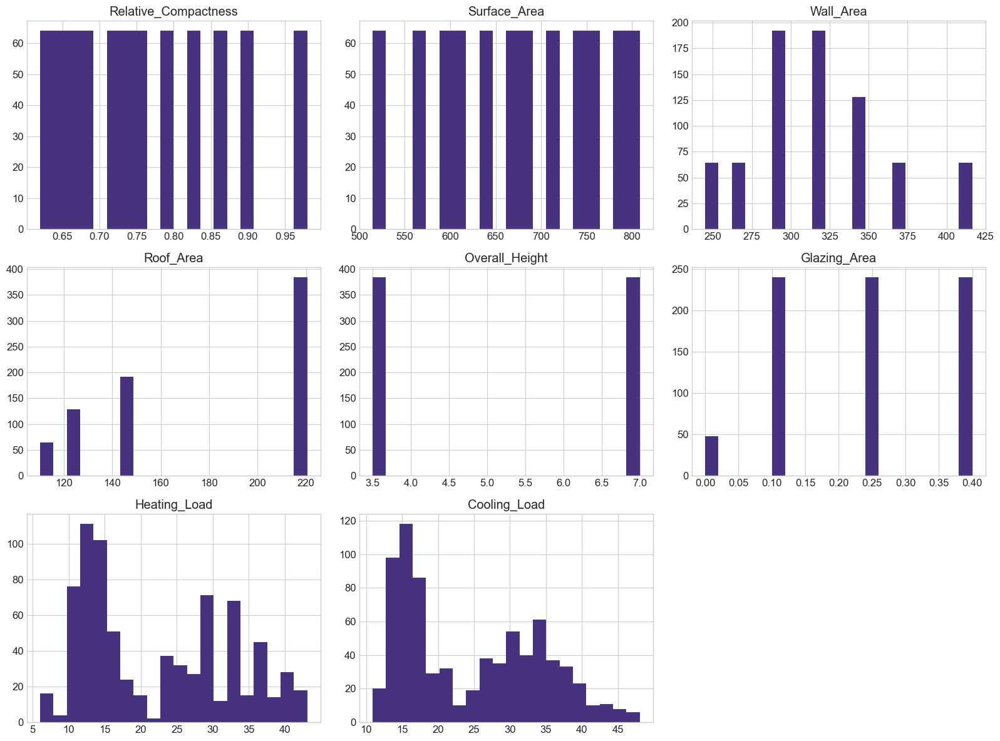

In [91]:
# Análise univariada - Histogramas
print("\nDistribuição das variáveis (histogramas):")
df.hist(figsize=(16, 12), bins=20)
plt.tight_layout()
plt.savefig('../../reports/figures/histogramas.png')
plt.show()

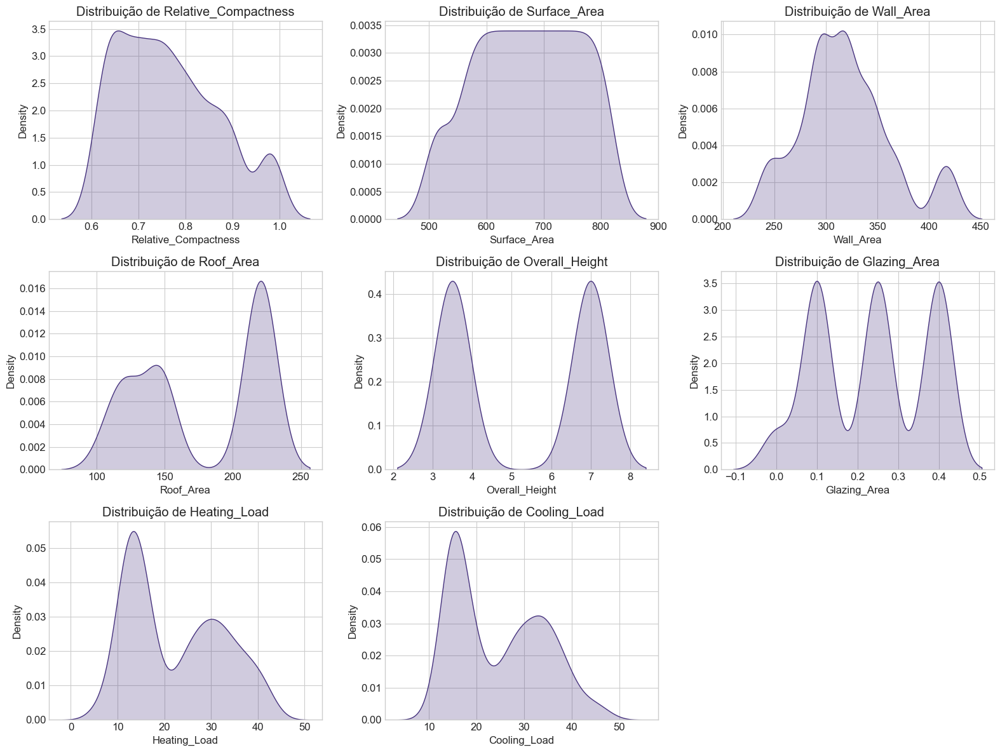

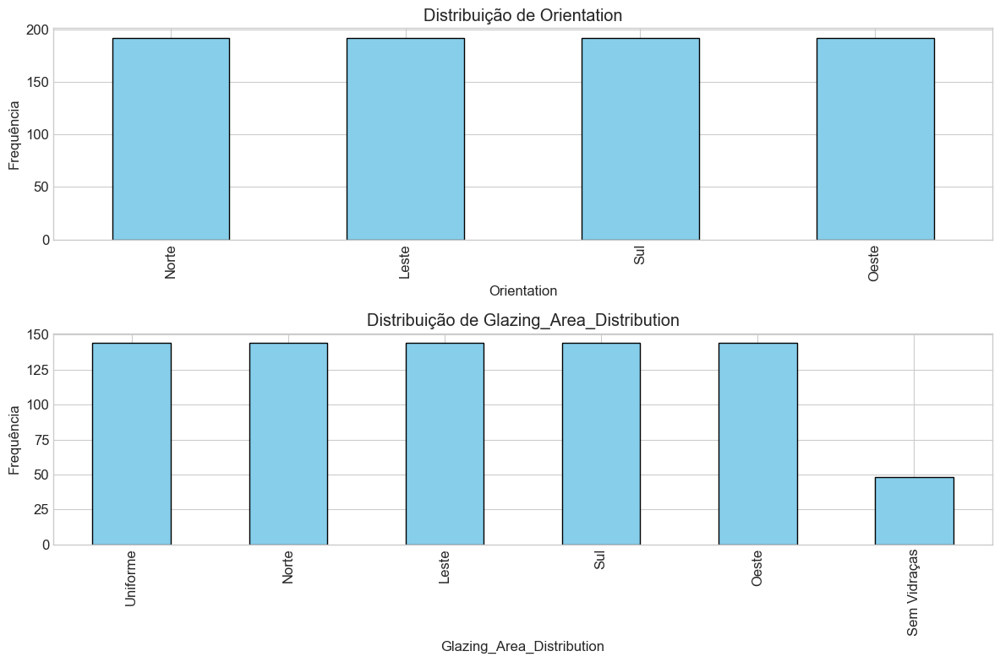

In [92]:
# Análise univariada - KDE plot

# Detecta colunas numéricas e categóricas
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = df.select_dtypes(include='category').columns

# --- KDE plots para variáveis numéricas ---
plt.figure(figsize=(16, 4 * ((len(numerical_cols) - 1) // 3 + 1)))
for i, col in enumerate(numerical_cols):
    plt.subplot((len(numerical_cols) - 1) // 3 + 1, 3, i + 1)
    sns.kdeplot(df[col], fill=True)
    plt.title(f'Distribuição de {col}')
    plt.grid(True)
plt.tight_layout()
plt.savefig('../../reports/figures/kde_numericas.png')
plt.show()

# --- Bar plots para variáveis categóricas ---
plt.figure(figsize=(12, 4 * len(categorical_cols)))
for i, col in enumerate(categorical_cols):
    plt.subplot(len(categorical_cols), 1, i + 1)
    df[col].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Distribuição de {col}')
    plt.xlabel(col)
    plt.ylabel('Frequência')
    plt.grid(True)
plt.tight_layout()
plt.savefig('../../reports/figures/barras_categoricas.png')
plt.show()



Boxplots para identificação de outliers:
Colunas numéricas: ['Relative_Compactness', 'Surface_Area', 'Wall_Area', 'Roof_Area', 'Overall_Height', 'Glazing_Area', 'Heating_Load', 'Cooling_Load']
Colunas categóricas: ['Orientation', 'Glazing_Area_Distribution']

Detalhamento quantitativo dos outliers por variável:


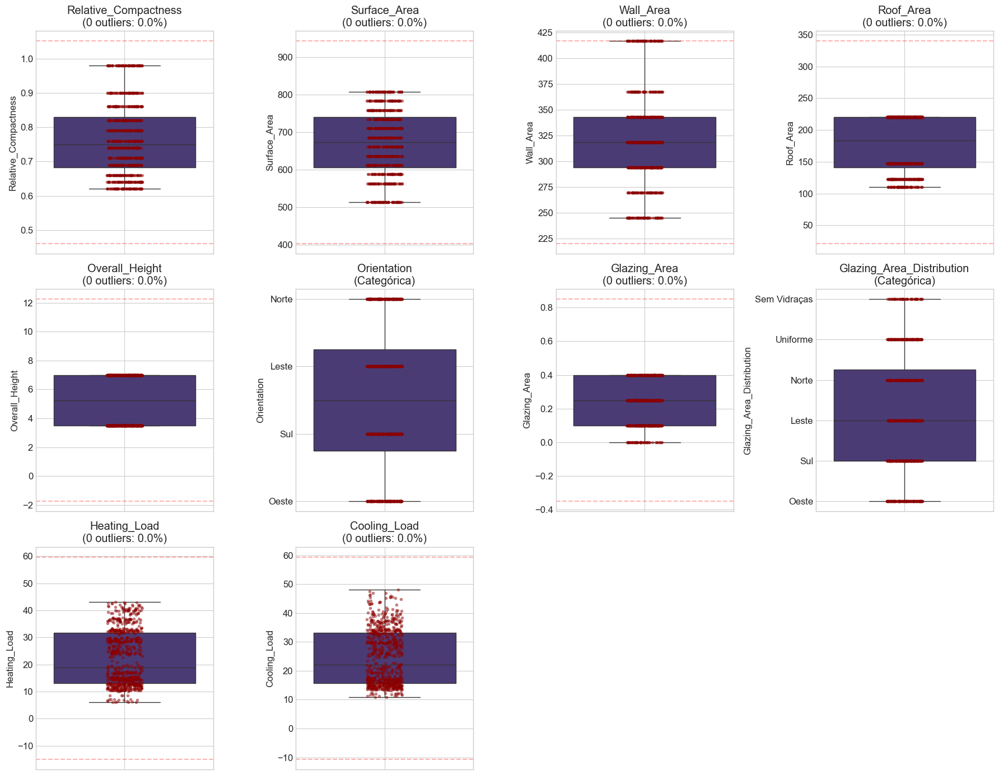

,Variável,Total Outliers,Porcentagem (%),Outliers Abaixo,Outliers Acima,Limite Inferior,Limite Superior
0,Relative_Compactness,0,0.0,0,0,0.46125,1.05125
1,Surface_Area,0,0.0,0,0,404.25000,943.25000
2,Wall_Area,0,0.0,0,0,220.50000,416.50000
3,Roof_Area,0,0.0,0,0,21.43750,339.93750
4,Overall_Height,0,0.0,0,0,-1.75000,12.25000
5,Glazing_Area,0,0.0,0,0,-0.35000,0.85000
6,Heating_Load,0,0.0,0,0,-15.02000,59.68000
7,Cooling_Load,0,0.0,0,0,-10.64875,59.40125


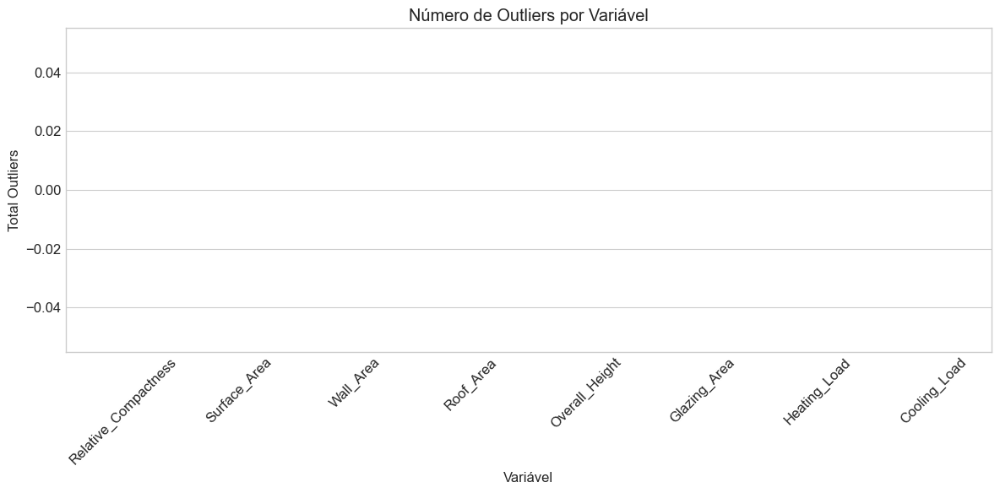

In [93]:
# Boxplots para identificação de outliers - Versão melhorada
print("\nBoxplots para identificação de outliers:")
plt.figure(figsize=(18, 14))

# Separar colunas numéricas
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
categorical_cols = df.select_dtypes(exclude=['number']).columns.tolist()

print(f"Colunas numéricas: {numeric_cols}")
print(f"Colunas categóricas: {categorical_cols}")

# Análise quantitativa de outliers (apenas para colunas numéricas)
print("\nDetalhamento quantitativo dos outliers por variável:")
outlier_summary = []

for i, col in enumerate(df.columns):
    plt.subplot(3, 4, i+1)
    
    # Configurar para mostrar os pontos outliers
    sns.boxplot(y=df[col], showfliers=True, fliersize=5)
    
    # Adicionar stripplot para mostrar distribuição dos pontos
    sns.stripplot(y=df[col], color='darkred', alpha=0.5, jitter=True, size=4)
    
    # Adicionar informação sobre quantidade de outliers (apenas para numéricas)
    if col in numeric_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        
        # Adicionar linhas indicando os limites de outliers
        plt.axhline(y=lower_bound, color='r', linestyle='--', alpha=0.3)
        plt.axhline(y=upper_bound, color='r', linestyle='--', alpha=0.3)
        
        plt.title(f"{col}\n({len(outliers)} outliers: {(len(outliers)/len(df)*100):.1f}%)")
        
        # Salvar informações de outliers para o resumo
        outlier_summary.append({
            'Variável': col,
            'Total Outliers': len(outliers),
            'Porcentagem (%)': ((len(outliers)) / len(df)) * 100,
            'Outliers Abaixo': len(df[df[col] < lower_bound]),
            'Outliers Acima': len(df[df[col] > upper_bound]),
            'Limite Inferior': lower_bound,
            'Limite Superior': upper_bound
        })
    else:
        plt.title(f"{col}\n(Categórica)")
    
    plt.grid(True)

plt.tight_layout()
plt.savefig('../../reports/figures/boxplots_with_outliers.png', dpi=300)
plt.show()

# Mostrar resumo de outliers
if outlier_summary:
    outlier_df = pd.DataFrame(outlier_summary)
    outlier_df = outlier_df.sort_values('Total Outliers', ascending=False)
    display(outlier_df)

    # Gráfico de barras mostrando a quantidade de outliers por variável
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Variável', y='Total Outliers', data=outlier_df)
    plt.title('Número de Outliers por Variável')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig('../../reports/figures/outliers_count.png')
    plt.show()
else:
    print("Nenhuma variável numérica com outliers encontrada.")

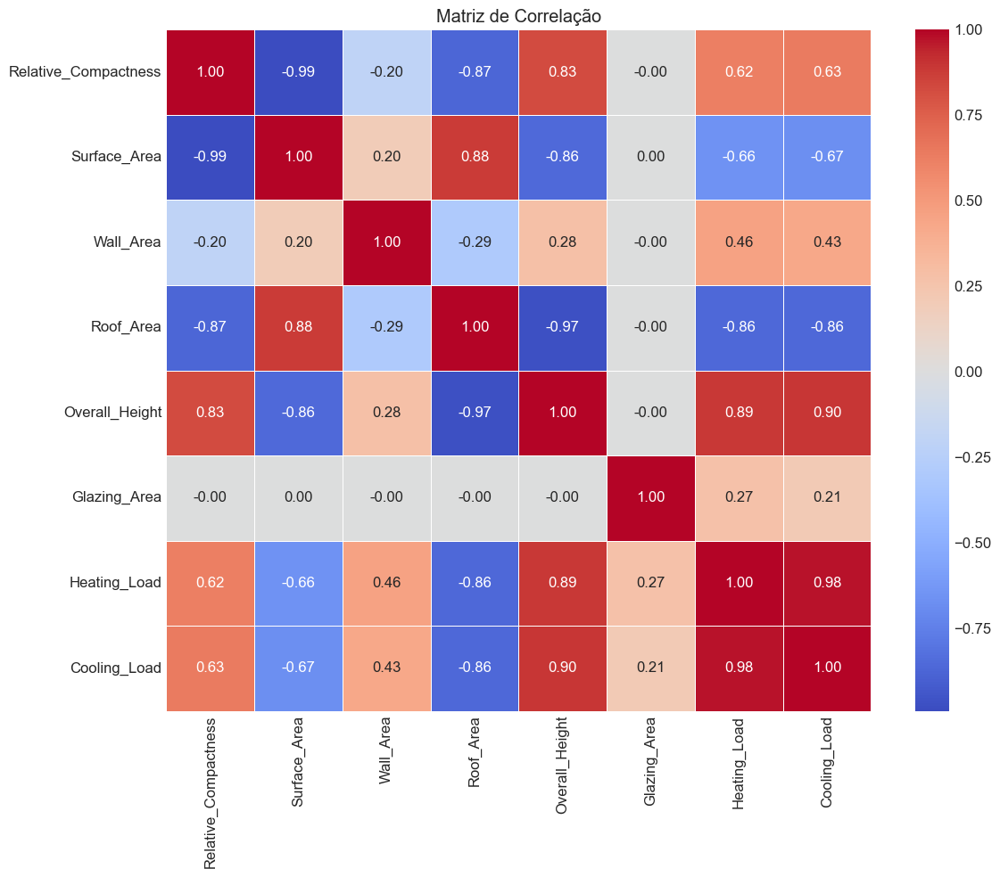

In [94]:
# Matriz de correlação apenas para variáveis numéricas
numerical_df = df.select_dtypes(include=['int64', 'float64'])
correlation_matrix = numerical_df.corr()

# Plot
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title('Matriz de Correlação')
plt.tight_layout()
plt.savefig('../../reports/figures/correlation_matrix.png')
plt.show()

**No entanto, queremos saber a correlação para todas as variáveis, inclusive as categóricas. Para isso podemos aplicar uma técnica para transformar nosso dataset.**

**Codificação com One-Hot Encoding (OHE) transforma variáveis categóricas em colunas binárias e permite calcular correlações**

In [95]:
# Cria cópia do DataFrame com One-Hot Encoding
df_encoded = pd.get_dummies(df, columns=['Orientation', 'Glazing_Area_Distribution'], drop_first=True)

# Matriz de correlação expandida
correlation_matrix = df_encoded.corr()

# Exibe correlação com a variável-alvo, por exemplo 'Heating_Load'
target = 'Heating_Load'
cor_with_target = correlation_matrix[target].sort_values(ascending=False)
print(cor_with_target)


Heating_Load                          1.000000
Cooling_Load                          0.975862
Overall_Height                        0.889431
Relative_Compactness                  0.622272
Wall_Area                             0.455671
Glazing_Area                          0.269841
Glazing_Area_Distribution_Uniforme    0.034249
Glazing_Area_Distribution_Norte       0.029882
Glazing_Area_Distribution_Sul         0.027606
Glazing_Area_Distribution_Leste       0.017830
Glazing_Area_Distribution_Oeste       0.017803
Orientation_Leste                     0.004207
Orientation_Oeste                    -0.001823
Orientation_Sul                      -0.002708
Surface_Area                         -0.658120
Roof_Area                            -0.861828
Name: Heating_Load, dtype: float64



Top correlações com Heating_Load:
Heating_Load                          1.000000
Cooling_Load                          0.975862
Overall_Height                        0.889431
Roof_Area                            -0.861828
Surface_Area                         -0.658120
Relative_Compactness                  0.622272
Wall_Area                             0.455671
Glazing_Area                          0.269841
Glazing_Area_Distribution_Uniforme    0.034249
Glazing_Area_Distribution_Norte       0.029882
Glazing_Area_Distribution_Sul         0.027606
Glazing_Area_Distribution_Leste       0.017830
Glazing_Area_Distribution_Oeste       0.017803
Orientation_Leste                     0.004207
Orientation_Sul                      -0.002708
Orientation_Oeste                    -0.001823
Name: Heating_Load, dtype: float64

Top correlações com Cooling_Load:
Cooling_Load                          1.000000
Heating_Load                          0.975862
Overall_Height                        0.895785
Ro

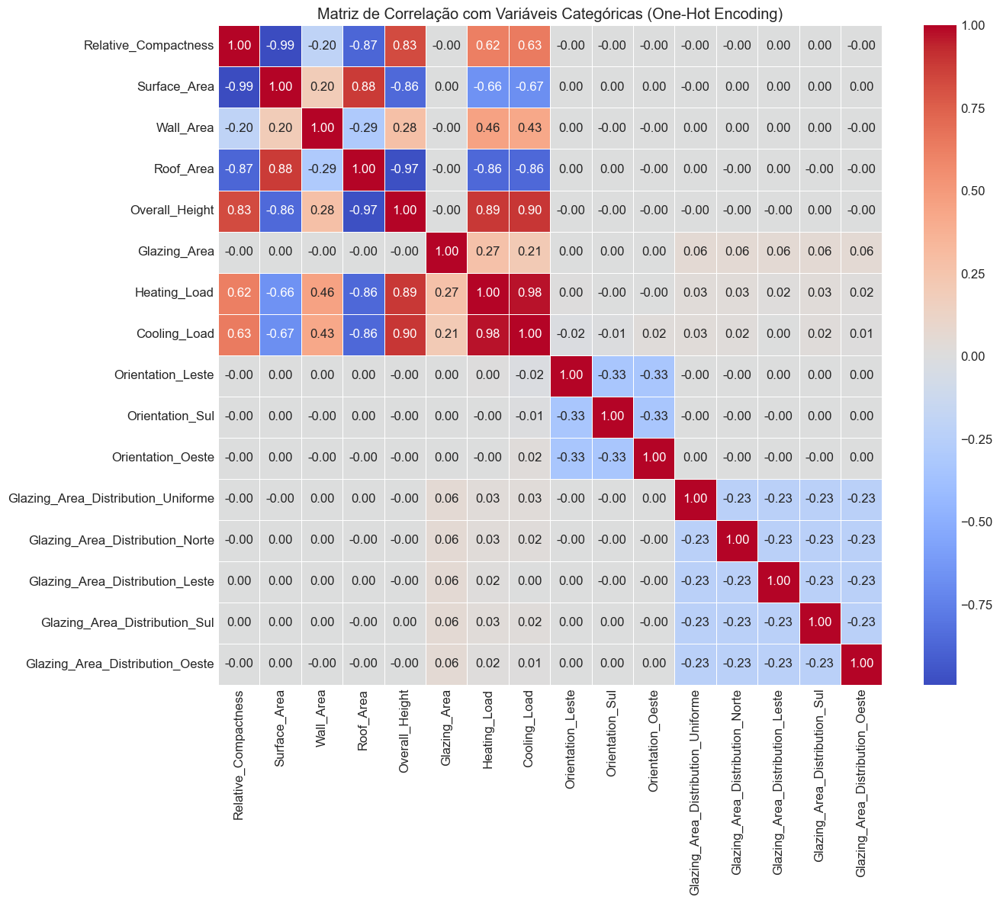

In [96]:
# 1. One-Hot Encoding nas variáveis categóricas
df_encoded = pd.get_dummies(df, columns=['Orientation', 'Glazing_Area_Distribution'], drop_first=True)

# 2. Matriz de correlação
correlation_matrix = df_encoded.corr()

# 3. Correlação com Heating_Load
cor_target_heat = correlation_matrix['Heating_Load'].sort_values(key=abs, ascending=False)
print("\nTop correlações com Heating_Load:")
print(cor_target_heat)

# Correlação com Cooling_Load
cor_target_cool = correlation_matrix['Cooling_Load'].sort_values(key=abs, ascending=False)
print("\nTop correlações com Cooling_Load:")
print(cor_target_cool)

# 4. Heatmap completo
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title('Matriz de Correlação com Variáveis Categóricas (One-Hot Encoding)')
plt.tight_layout()
plt.savefig('../../reports/figures/correlation_matrix_with_categoricals.png')
plt.show()


**Podemos fazer o cálculo de correlação usando ANOVA (para categóricas x contínuas). Pode-se medir a influência de uma variável categórica sobre uma contínua (ex: Orientation vs Heating_Load), usando ANOVA F-value.**

In [97]:
from sklearn.feature_selection import f_classif, f_regression

# Exemplo para categórica 'Orientation' com target contínua 'Heating_Load'
X = df[['Orientation']]
y = df['Heating_Load']

# One-hot para a categórica
X_encoded = pd.get_dummies(X, drop_first=True)

# Correlação tipo ANOVA (F-score e p-value)
f_values, p_values = f_regression(X_encoded, y)

# Resultado
for col, f, p in zip(X_encoded.columns, f_values, p_values):
    print(f'{col} -> F-value: {f:.2f}, p-value: {p:.4f}')


Orientation_Leste -> F-value: 0.01, p-value: 0.9073
Orientation_Sul -> F-value: 0.01, p-value: 0.9403
Orientation_Oeste -> F-value: 0.00, p-value: 0.9598


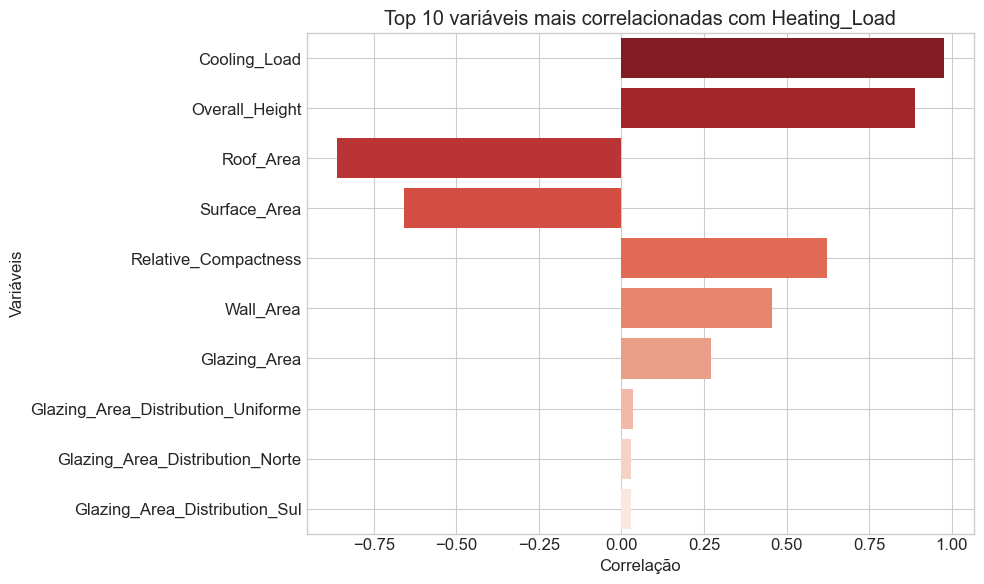

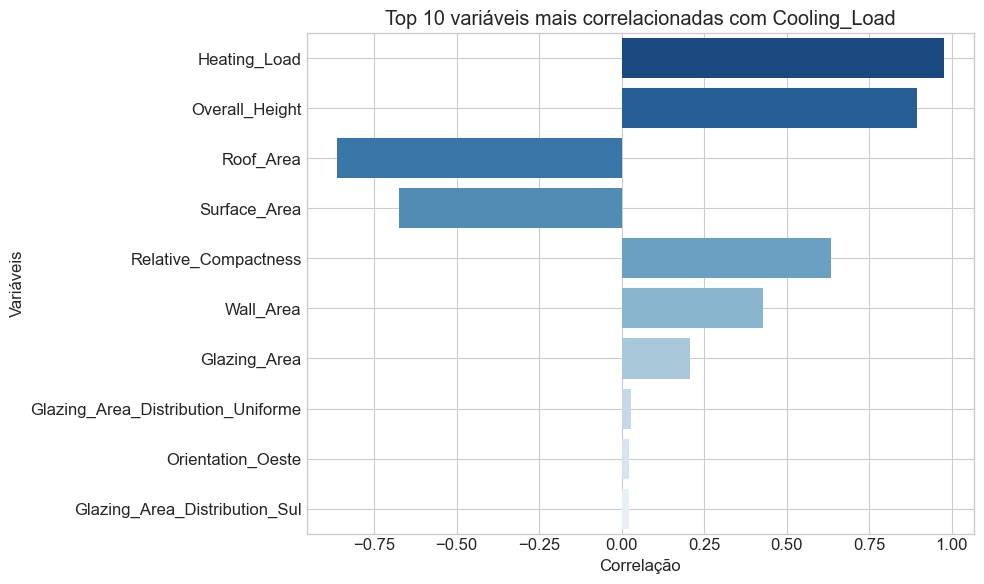

In [98]:
# One-Hot Encoding nas variáveis categóricas
df_encoded = pd.get_dummies(df, columns=['Orientation', 'Glazing_Area_Distribution'], drop_first=True)

# Matriz de correlação
correlation_matrix = df_encoded.corr()

# Correlação com Heating_Load
cor_target_heat = correlation_matrix['Heating_Load'].drop('Heating_Load').sort_values(key=abs, ascending=False)
top_heat = cor_target_heat.head(10)

# Correlação com Cooling_Load
cor_target_cool = correlation_matrix['Cooling_Load'].drop('Cooling_Load').sort_values(key=abs, ascending=False)
top_cool = cor_target_cool.head(10)

# Gráfico de barras - Heating_Load
plt.figure(figsize=(10, 6))
sns.barplot(x=top_heat.values, y=top_heat.index, hue=top_heat.index, palette='Reds_r', legend=False)
plt.title('Top 10 variáveis mais correlacionadas com Heating_Load')
plt.xlabel('Correlação')
plt.ylabel('Variáveis')
plt.grid(True)
plt.tight_layout()
plt.savefig('../../reports/figures/top10_correlation_heating.png')
plt.show()

# Gráfico de barras - Cooling_Load
plt.figure(figsize=(10, 6))
sns.barplot(x=top_cool.values, y=top_cool.index, hue=top_cool.index, palette='Blues_r', legend=False)
plt.title('Top 10 variáveis mais correlacionadas com Cooling_Load')
plt.xlabel('Correlação')
plt.ylabel('Variáveis')
plt.grid(True)
plt.tight_layout()
plt.savefig('../../reports/figures/top10_correlation_cooling.png')
plt.show()




Relação entre variáveis de entrada e Heating Load:


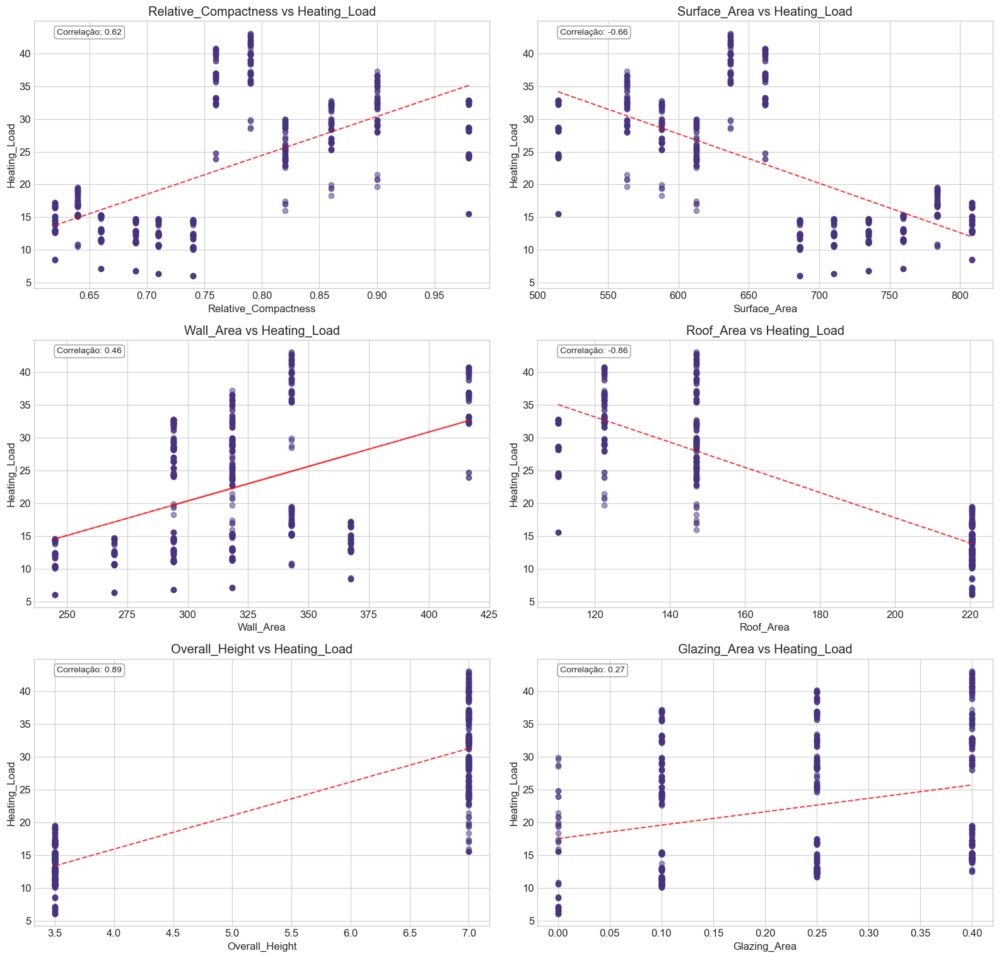

In [99]:
# Análise de relação entre variáveis de entrada e Heating Load
print("\nRelação entre variáveis de entrada e Heating Load:")

# Definir as variáveis de entrada (excluindo as variáveis categóricas e de saída)
input_vars = df.select_dtypes(include=['float64', 'int64']).columns[:-2]  # Todas as colunas numéricas exceto as duas últimas (saídas)
output_var = df.columns[-2]   # Heating Load

plt.figure(figsize=(16, 20))
for i, input_var in enumerate(input_vars):
    plt.subplot(4, 2, i+1)
    plt.scatter(df[input_var], df[output_var], alpha=0.5)
    plt.title(f'{input_var} vs {output_var}')
    plt.xlabel(input_var)
    plt.ylabel(output_var)
    plt.grid(True)

    # Adicionar linha de tendência
    z = np.polyfit(df[input_var], df[output_var], 1)  # Ajuste polinomial de grau 1 (reta)
    p = np.poly1d(z)  # Função para calcular os valores da linha de tendência
    plt.plot(df[input_var], p(df[input_var]), "r--", alpha=0.8)  # Linha de tendência em vermelho

    # Adicionar coeficiente de correlação
    corr = df[input_var].corr(df[output_var])
    plt.annotate(f'Correlação: {corr:.2f}', 
                 xy=(0.05, 0.95), 
                 xycoords='axes fraction', 
                 fontsize=10,
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

plt.tight_layout()
plt.savefig('../../reports/figures/scatter_heating.png')
plt.show()



Relação entre variáveis de entrada e Cooling Load:


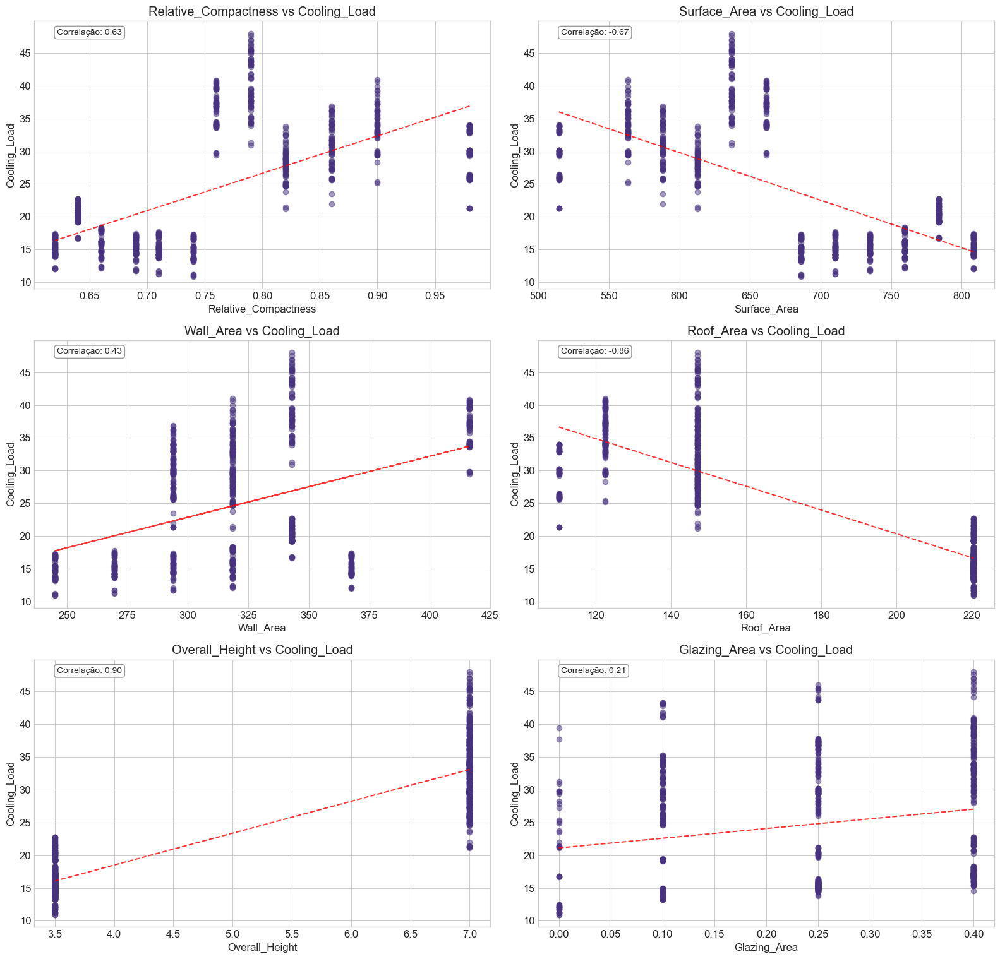

In [100]:
# Análise de relação entre variáveis de entrada e Cooling Load
print("\nRelação entre variáveis de entrada e Cooling Load:")
output_var = df.columns[-1]  # Cooling Load

plt.figure(figsize=(16, 20))
for i, input_var in enumerate(input_vars):
    plt.subplot(4, 2, i+1)
    plt.scatter(df[input_var], df[output_var], alpha=0.5)
    plt.title(f'{input_var} vs {output_var}')
    plt.xlabel(input_var)
    plt.ylabel(output_var)
    plt.grid(True)

    # Adicionar linha de tendência
    z = np.polyfit(df[input_var], df[output_var], 1)  # Ajuste polinomial de grau 1 (reta)
    p = np.poly1d(z)  # Função para calcular os valores da linha de tendência
    plt.plot(df[input_var], p(df[input_var]), "r--", alpha=0.8)  # Linha de tendência em vermelho

    # Adicionar coeficiente de correlação
    corr = df[input_var].corr(df[output_var])
    plt.annotate(f'Correlação: {corr:.2f}', 
                 xy=(0.05, 0.95), 
                 xycoords='axes fraction', 
                 fontsize=10,
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

plt.tight_layout()
plt.savefig('../../reports/figures/scatter_cooling.png')
plt.show()



Correlação das variáveis com Heating Load e Cooling Load:
                      Heating_Load  Cooling_Load
Overall_Height            0.889431      0.895785
Relative_Compactness      0.622272      0.634339
Wall_Area                 0.455671      0.427117
Glazing_Area              0.269841      0.207505
Surface_Area             -0.658120     -0.672999
Roof_Area                -0.861828     -0.862547


<Figure size 1200x600 with 0 Axes>

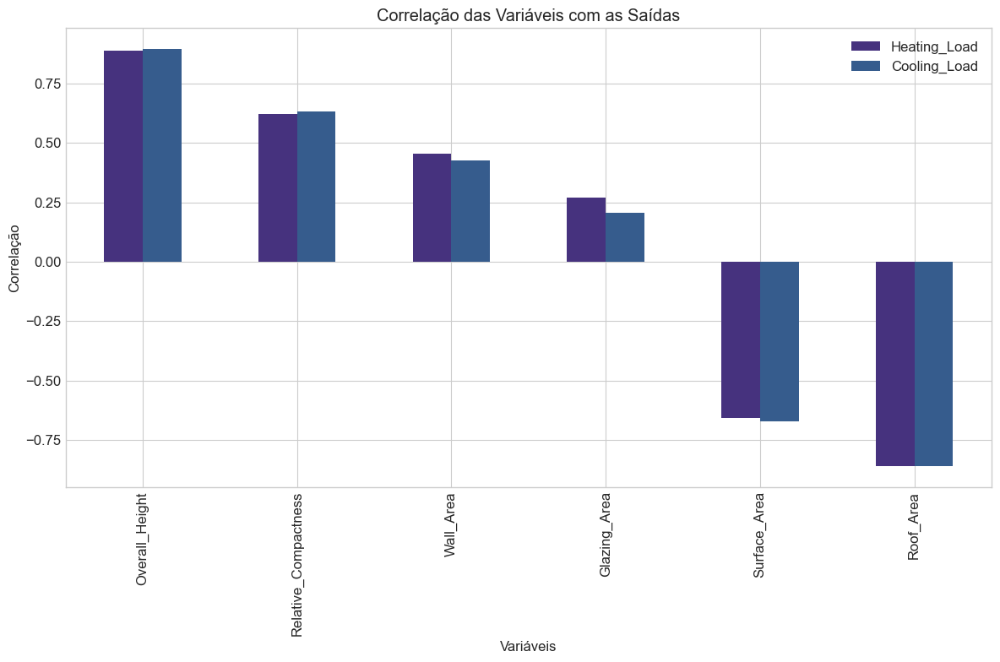

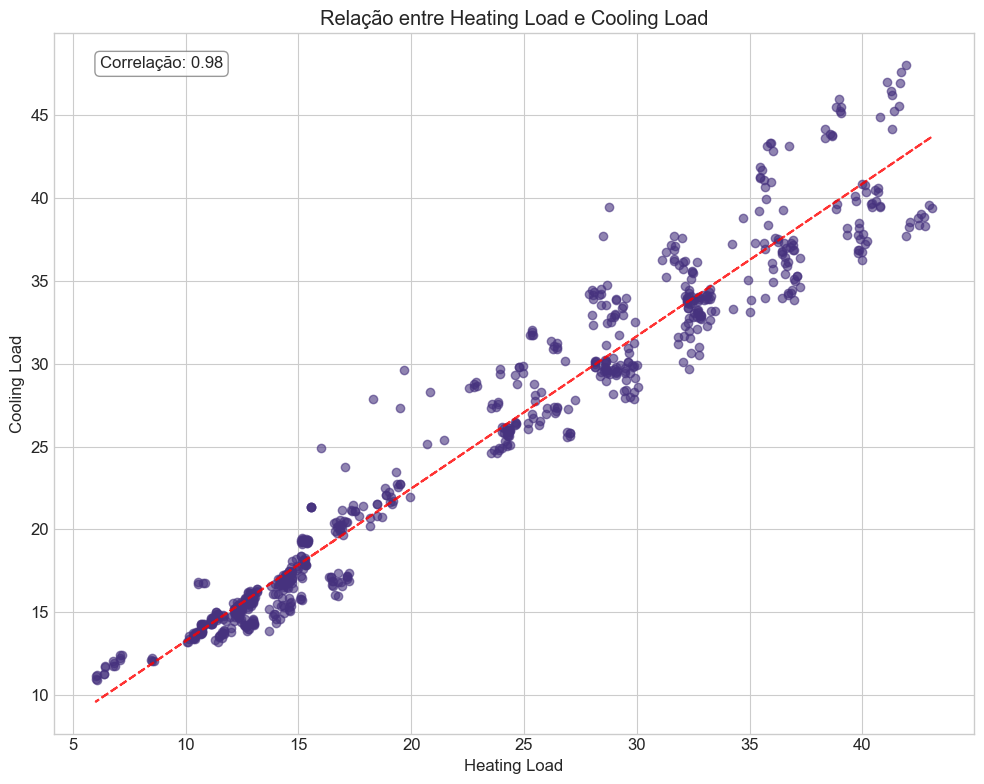

In [101]:
# Análise de correlação com variáveis de saída
# Selecione apenas as colunas numéricas para calcular a correlação
numerical_columns = df.select_dtypes(include=[np.number]).columns

# Análise de correlação com variáveis de saída
print("\nCorrelação das variáveis com Heating Load e Cooling Load:")
correlation_with_targets = pd.DataFrame({
    'Heating_Load': df[numerical_columns].corr()['Heating_Load'].drop(['Heating_Load', 'Cooling_Load']),
    'Cooling_Load': df[numerical_columns].corr()['Cooling_Load'].drop(['Heating_Load', 'Cooling_Load'])
}).sort_values(by='Heating_Load', ascending=False)

print(correlation_with_targets)

# Gráfico de barras para visualizar as correlações
plt.figure(figsize=(12, 6))
correlation_with_targets.plot(kind='bar')
plt.title('Correlação das Variáveis com as Saídas')
plt.xlabel('Variáveis')
plt.ylabel('Correlação')
plt.grid(True)
plt.tight_layout()
plt.savefig('../../reports/figures/correlation_bar.png')
plt.show()


# Análise da relação entre Heating Load e Cooling Load
plt.figure(figsize=(10, 8))
plt.scatter(df['Heating_Load'], df['Cooling_Load'], alpha=0.6)
plt.title('Relação entre Heating Load e Cooling Load')
plt.xlabel('Heating Load')
plt.ylabel('Cooling Load')
plt.grid(True)

# Adicionar linha de tendência
z = np.polyfit(df['Heating_Load'], df['Cooling_Load'], 1)  # Ajuste linear (reta)
p = np.poly1d(z)  # Função polinomial para a linha de tendência
plt.plot(df['Heating_Load'], p(df['Heating_Load']), "r--", alpha=0.8)

# Adicionar coeficiente de correlação
corr = df['Heating_Load'].corr(df['Cooling_Load'])
plt.annotate(f'Correlação: {corr:.2f}', 
             xy=(0.05, 0.95), 
             xycoords='axes fraction', 
             fontsize=12,
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

plt.tight_layout()
plt.savefig('../../reports/figures/heating_vs_cooling.png')
plt.show()



Pairplot para visualizar relações entre variáveis:


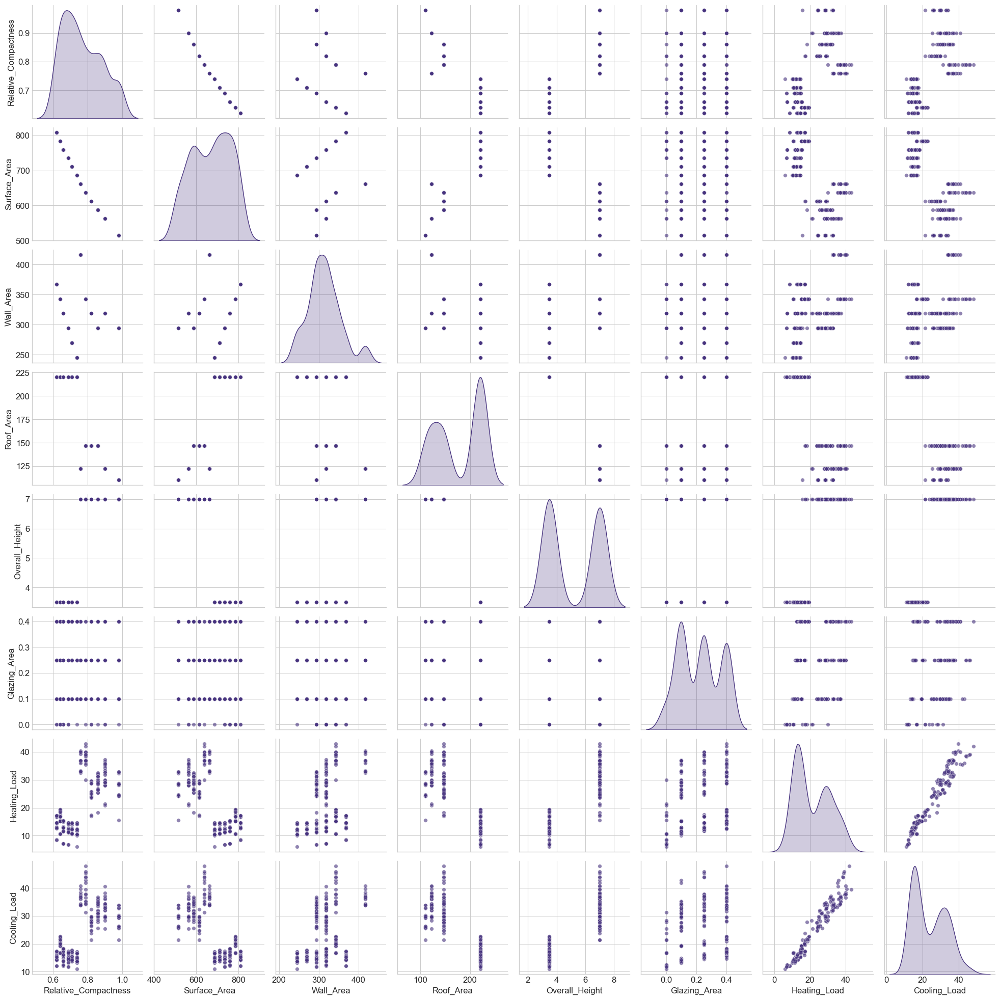

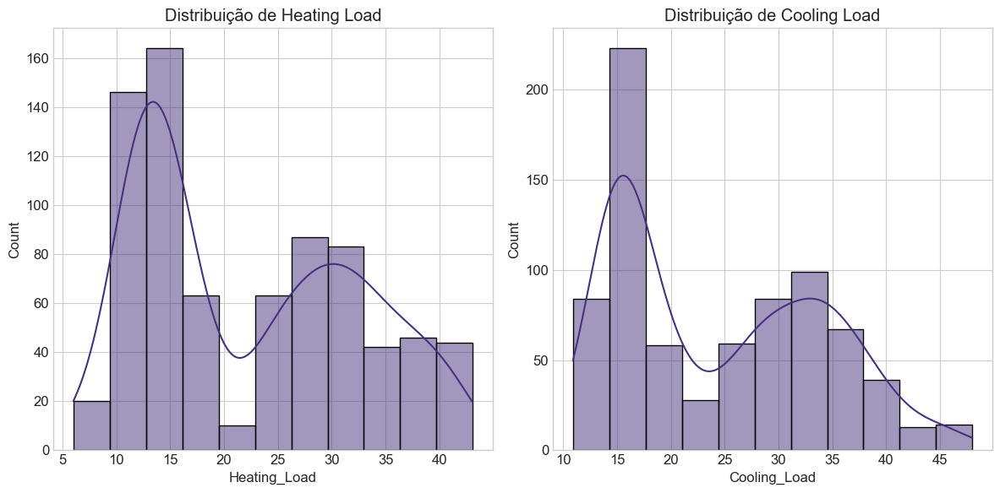

In [102]:
# Pairplot para visualizar relações entre múltiplas variáveis
print("\nPairplot para visualizar relações entre variáveis:")
sns.pairplot(df.sample(min(250, len(df))), diag_kind='kde', plot_kws={'alpha': 0.6, 's': 30})
plt.savefig('../../reports/figures/pairplot.png')
plt.show()

# Análise de distribuição das variáveis de saída
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(df['Heating_Load'], kde=True)
plt.title('Distribuição de Heating Load')
plt.grid(True)

plt.subplot(1, 2, 2)
sns.histplot(df['Cooling_Load'], kde=True)
plt.title('Distribuição de Cooling Load')
plt.grid(True)

plt.tight_layout()
plt.savefig('../../reports/figures/target_distributions.png')
plt.show()


Análise por Orientação (Orientation):
            Heating_Load                         Cooling_Load            \
                    mean        std   min    max         mean       std   
Orientation                                                               
Norte          22.312865  10.108994  6.07  42.77    24.604531  9.609397   
Leste          22.380677  10.140485  6.05  43.10    24.312552  9.310330   
Sul            22.259896  10.119358  6.01  42.74    24.480313  9.375210   
Oeste          22.275365  10.070552  6.04  42.96    24.953646  9.812926   

                           
               min    max  
Orientation                
Norte        10.90  46.44  
Leste        11.19  47.59  
Sul          10.94  47.01  
Oeste        11.17  48.03  


/var/folders/8g/9xkvwwt54q96bnylvpbp201h0000gn/T/ipykernel_65876/2037861123.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



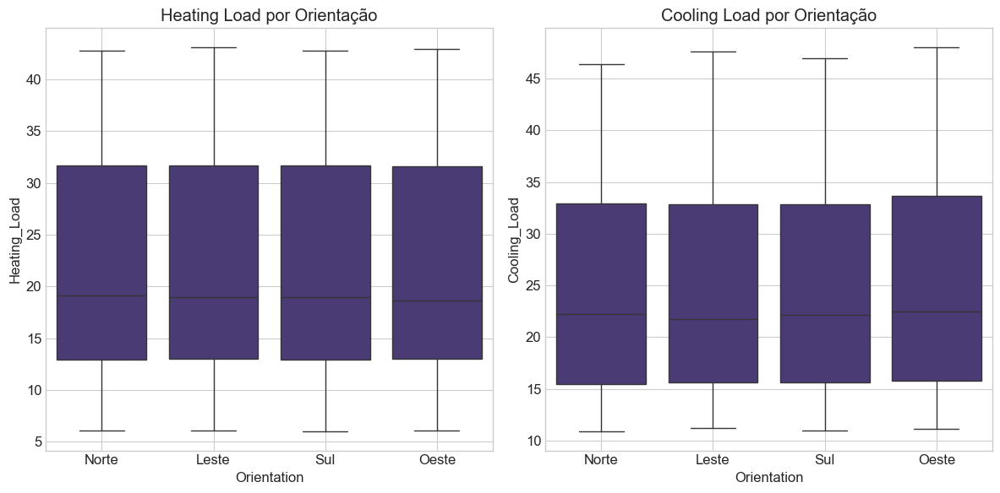

In [103]:
# Análise de estatísticas para Orientation
if 'Orientation' in df.columns:
    print("\nAnálise por Orientação (Orientation):")
    orientation_stats = df.groupby('Orientation').agg({
        'Heating_Load': ['mean', 'std', 'min', 'max'],
        'Cooling_Load': ['mean', 'std', 'min', 'max']
    })
    print(orientation_stats)
    
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    sns.boxplot(x='Orientation', y='Heating_Load', data=df)
    plt.title('Heating Load por Orientação')
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x='Orientation', y='Cooling_Load', data=df)
    plt.title('Cooling Load por Orientação')
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig('../../reports/figures/orientation_analysis.png')
    plt.show()


Análise por Distribuição de Área Envidraçada (Glazing Area Distribution):
                          Heating_Load                          Cooling_Load  \
                                  mean        std    min    max         mean   
Glazing_Area_Distribution                                                      
Sem Vidraças                 14.286458   7.625241   6.01  29.90    19.706250   
Uniforme                     23.026111  10.031912  10.36  42.62    25.179514   
Norte                        22.934444  10.053273  10.32  43.10    24.996875   
Leste                        22.681458   9.990464  10.34  42.49    24.659444   
Sul                          22.886667  10.064130  10.07  42.96    25.015139   
Oeste                        22.680903  10.051781  10.34  42.11    24.715000   

                                                   
                                std    min    max  
Glazing_Area_Distribution                          
Sem Vidraças               8.134356  10.90  39.4

/var/folders/8g/9xkvwwt54q96bnylvpbp201h0000gn/T/ipykernel_65876/1651775220.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



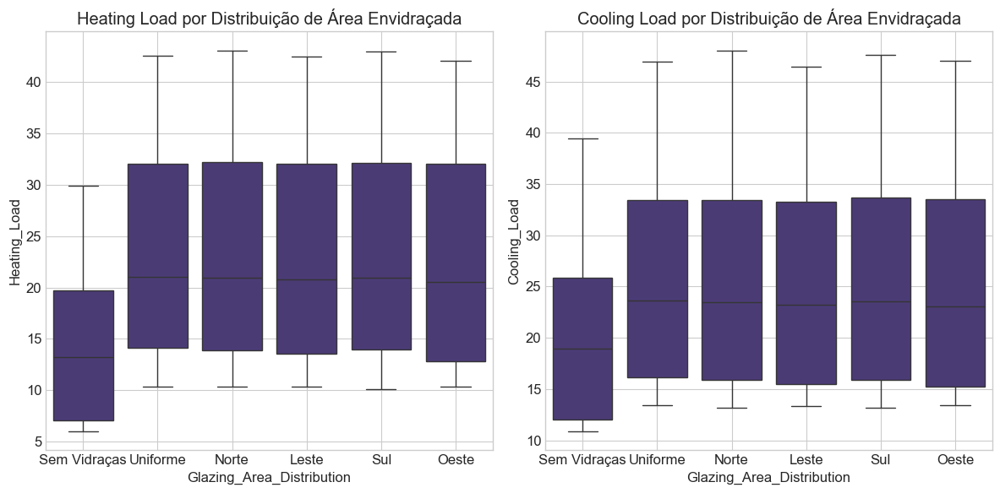

In [104]:
# Análise de estatísticas para Glazing Area Distribution
if 'Glazing_Area_Distribution' in df.columns:
    print("\nAnálise por Distribuição de Área Envidraçada (Glazing Area Distribution):")
    glazing_stats = df.groupby('Glazing_Area_Distribution').agg({
        'Heating_Load': ['mean', 'std', 'min', 'max'],
        'Cooling_Load': ['mean', 'std', 'min', 'max']
    })
    print(glazing_stats)
    
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    sns.boxplot(x='Glazing_Area_Distribution', y='Heating_Load', data=df)
    plt.title('Heating Load por Distribuição de Área Envidraçada')
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x='Glazing_Area_Distribution', y='Cooling_Load', data=df)
    plt.title('Cooling Load por Distribuição de Área Envidraçada')
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig('../../reports/figures/glazing_distribution_analysis.png')
    plt.show()

**A análise de Variance Inflation Factor (VIF) é uma ferramenta útil para identificar problemas de multicolinearidade entre as variáveis independentes (ou de entrada) em um modelo de regressão.**

**Multicolinearidade ocorre quando uma ou mais variáveis independentes em um modelo estão altamente correlacionadas entre si. Isso pode causar instabilidade nos coeficientes da regressão, dificultando a interpretação e o entendimento da relação entre as variáveis independentes e a variável dependente.**

**O VIF mede o quanto a variância de um coeficiente de regressão é aumentada devido à colinearidade com outras variáveis. O cálculo do VIF para cada variável e tem as seguintes condições:**

**VIF = 1: Nenhuma multicolinearidade. A variável é independente das outras variáveis.**

**1 < VIF < 5: Multicolinearidade moderada, mas geralmente aceitável.**

**VIF ≥ 5 ou 10: Indica um problema sério de multicolinearidade, o que significa que a variável está altamente correlacionada com outras variáveis no modelo.**

In [105]:
# Análise de multicolinearidade entre as variáveis de entrada
# Variance Inflation Factor (VIF)
from statsmodels.stats.outliers_influence import variance_inflation_factor

print("\nAnálise de Multicolinearidade - Variance Inflation Factor (VIF):")
X = df[input_vars]
vif_data = pd.DataFrame()
vif_data["Variável"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print(vif_data.sort_values("VIF", ascending=False))


Análise de Multicolinearidade - Variance Inflation Factor (VIF):
               Variável         VIF
1          Surface_Area         inf
2             Wall_Area         inf
3             Roof_Area         inf
0  Relative_Compactness  166.928577
4        Overall_Height  133.969808
5          Glazing_Area    4.098780


/Applications/anaconda3/envs/analise_preditiva/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning:

divide by zero encountered in scalar divide



**Inf (infinito): Quando o VIF é "inf" (infinito), isso significa que a variável é perfeitamente colinear com outras variáveis no modelo. Em outras palavras, há uma correlação linear perfeita entre as variáveis (Surface_Area, Wall_Area e Roof_Area). Isso pode ocorrer porque essas variáveis estão diretamente relacionadas e uma pode ser expressa como uma combinação linear das outras, o que é um claro indicativo de multicolinearidade forte.**

**Para resolver isso, podemos remover uma das variáveis colineares ou tentar combinar variáveis altamente correlacionadas (por exemplo, somando ou criando uma nova variável composta).**

**Relative_Compactness (166.93) e Overall_Height (133.97): Ambos têm um VIF muito alto, o que indica forte multicolinearidade com outras variáveis no modelo. Neste caso, pode-se tentar remover ou transformar essas variáveis para reduzir a multicolinearidade. Uma opção seria verificar a correlação entre essas variáveis para ver quais estão altamente correlacionadas e, se necessário, remover ou combinar algumas delas.**

**Glazing_Area (4.10): Este VIF está abaixo de 5, o que indica que não há multicolinearidade significativa com outras variáveis. Essa variável pode ser mantida no modelo sem grandes problemas de colinearidade.**

**O que pode ser realizado para resolver esse problema de multicolinearidade?**

**Como Surface_Area, Wall_Area, e Roof_Area apresentam um VIF infinito, isso sugere que há colinearidade perfeita entre elas. Sendo assim, pode-se excluir uma delas ou combinar essas variáveis em uma nova varirável, por exemplo, somando essas áreas ou criando uma variável composta que represente a área total no caso. As análises da matriz de correlação e de PCA podem nos ajudar a tomar decisões em como resolver essa questão, sendo que a PCA pode ajudar a reduzir a multicolinearidade sem perder informações importantes.**

**Em resumo, o VIF ajuda a identificar variáveis que podem ser redundantes devido à sua alta correlação com outras. No seu caso, há variáveis que causam multicolinearidade significativa e precisam ser abordadas para melhorar a estabilidade e a interpretabilidade do seu modelo.**

In [106]:
# Salvar dataframe processado
df.to_csv('../../data/processed/energy_efficiency_processed.csv', index=False)
print("\nDataFrame processado salvo em 'data/processed/energy_efficiency_processed.csv'")


DataFrame processado salvo em 'data/processed/energy_efficiency_processed.csv'


**A Análise de Componentes Principais (PCA) é uma técnica de redução de dimensionalidade que projeta os dados em um novo espaço de características, de modo que as novas variáveis (os componentes principais) são combinações lineares das variáveis originais e são ordenadas pela quantidade de variância que capturam.**



In [107]:
# Análise de Componentes Principais (PCA) para visualização
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

print("\nAnálise de Componentes Principais (PCA):")
X = df[input_vars].values
X_std = StandardScaler().fit_transform(X)

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_std)
principalDf = pd.DataFrame(data=principalComponents, columns=['PC1', 'PC2'])

print(f"Variância explicada por PC1: {pca.explained_variance_ratio_[0]:.4f}")
print(f"Variância explicada por PC2: {pca.explained_variance_ratio_[1]:.4f}")
print(f"Variância explicada total: {sum(pca.explained_variance_ratio_):.4f}")


Análise de Componentes Principais (PCA):
Variância explicada por PC1: 0.6172
Variância explicada por PC2: 0.2066
Variância explicada total: 0.8238


**O primeiro componente principal (PC1) captura 61,72% da variância dos dados. Isso significa que PC1 é responsável por uma parte significativa da variação nas variáveis originais. Em outras palavras, se você projetar os dados no espaço formado pelo PC1, você estará mantendo mais de 60% da informação original. Esse componente provavelmente reflete a maior parte da estrutura subjacente dos dados.**

**O segundo componente principal (PC2) explica 20,66% da variância. Embora menos importante que o PC1, ele ainda captura uma quantidade significativa de variação nos dados. O PC2, junto com o PC1, representa 82,38% da variância total nos dados, o que significa que você pode representar a maior parte da informação original com apenas dois componentes principais.**

**A variância explicada total por PC1 e PC2 é de 82,38%, o que é bastante alto. Isso indica que, ao utilizar apenas os dois primeiros componentes principais, você pode reduzir significativamente a dimensionalidade dos dados sem perder muita informação. Em outras palavras, dois componentes principais (PC1 e PC2) são suficientes para descrever a maior parte da variabilidade nos dados.**

**Mas quais são as principais implicações desses resultados?**

**1 - Redução de Dimensionalidade: Você conseguiu reduzir as variáveis originais para 2 componentes principais que mantêm mais de 80% da informação original. Isso é útil quando você quer simplificar o modelo ou visualizar os dados de forma mais clara, mantendo a maior parte da variabilidade.**

**2 - Visualização: Com apenas dois componentes principais, você pode projetar seus dados em um gráfico 2D, facilitando a visualização da estrutura e das relações entre as observações. Isso é especialmente útil para explorar padrões, agrupamentos e outliers.**

**Visualização dos Componentes: Pode-se criar um gráfico de dispersão (scatter plot) para visualizar como os dados se distribuem no novo espaço formado pelos dois componentes principais. Isso pode ajudar a identificar clusters, tendências ou padrões não aparentes nas variáveis originais.**

**Interpretar os Componentes: Para entender melhor o que cada componente significa, pode-se olhar os coeficientes de cada variável nos componentes principais. Se olharmos os valores das componentes, poderemos ter uma ideia de como as variáveis originais influenciam os componentes principais.**

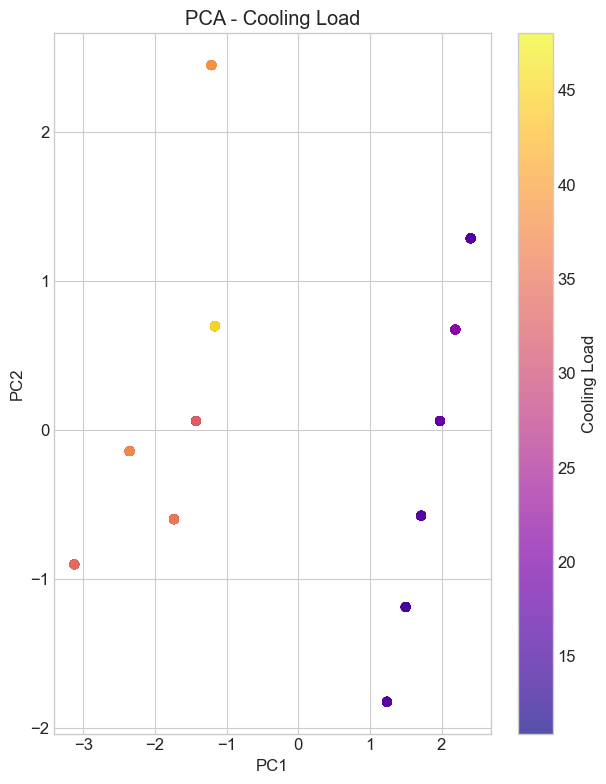

In [108]:
# Visualização PCA com Cooling Load
plt.subplot(1, 2, 2)
scatter = plt.scatter(principalDf['PC1'], principalDf['PC2'], 
                      c=df['Cooling_Load'], cmap='plasma', alpha=0.7)
plt.colorbar(scatter, label='Cooling Load')
plt.title('PCA - Cooling Load')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

plt.tight_layout()
plt.savefig('../../reports/figures/pca_analysis.png')
plt.show()

**Mesmos gráficos, mas agora interativos**

In [109]:
import plotly.express as px

# Criar o gráfico interativo com Plotly
fig = px.scatter(principalDf, x='PC1', y='PC2', color=df['Cooling_Load'],
                 title="PCA - Cooling Load",
                 labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2', 'Cooling_Load': 'Cooling Load'},
                 color_continuous_scale='plasma')

# Adicionar a possibilidade de exibir as variáveis ao passar o mouse
fig.update_traces(marker=dict(size=8, opacity=0.7, line=dict(width=1, color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

# Exibir o gráfico
fig.show()

# Opcional: Salvar como arquivo HTML
fig.write_html('../../reports/figures/pca_analysis_interactive.html')

In [110]:
import plotly.express as px

# Criar o gráfico interativo com Plotly para Heating Load
fig = px.scatter(principalDf, x='PC1', y='PC2', color=df['Heating_Load'],
                 title="PCA - Heating Load",
                 labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2', 'Heating_Load': 'Heating Load'},
                 color_continuous_scale='viridis')

# Adicionar a possibilidade de exibir as variáveis ao passar o mouse
fig.update_traces(marker=dict(size=8, opacity=0.7, line=dict(width=1, color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

# Exibir o gráfico
fig.show()

# Opcional: Salvar como arquivo HTML
fig.write_html('../../reports/figures/pca_analysis_heating_interactive.html')


**Em resumo, os pontos representam observações do seu dataset e suas coordenadas no gráfico PCA mostram como essas observações se distribuem com base nas variáveis originais, enquanto as cores ajudam a entender como uma variável de interesse (como Heating_Load) se relaciona com essa distribuição.**

In [111]:
# Conclusões iniciais
print("\nConclusões iniciais da análise exploratória:")
print("1. Variáveis mais correlacionadas com Heating Load:")
for var, corr in correlation_with_targets['Heating_Load'].items():
    print(f"   - {var}: {corr:.4f}")
    
print("\n2. Variáveis mais correlacionadas com Cooling Load:")
for var, corr in correlation_with_targets['Cooling_Load'].items():
    print(f"   - {var}: {corr:.4f}")
    
print("\n3. Correlação entre Heating Load e Cooling Load:", 
      df['Heating_Load'].corr(df['Cooling_Load']).round(4))

print("\n4. Possível multicolinearidade detectada entre algumas variáveis de entrada.")
high_vif_vars = vif_data[vif_data["VIF"] > 10]["Variável"].tolist()
if high_vif_vars:
    print(f"   Variáveis com VIF > 10 (indicativo de multicolinearidade): {high_vif_vars}")

print("\n5. Presença de outliers não detectada nas variáveis.")

print("\n6. Recomendações para pré-processamento:")
print("   - Padronização das variáveis para modelagem")
print("   - Considerar técnicas para lidar com multicolinearidade (PCA, seleção de features)")
print("   - Verificar se é necessário tratamento de outliers")
print("   - Explorar transformações não-lineares para capturar relações complexas")


Conclusões iniciais da análise exploratória:
1. Variáveis mais correlacionadas com Heating Load:
   - Overall_Height: 0.8894
   - Relative_Compactness: 0.6223
   - Wall_Area: 0.4557
   - Glazing_Area: 0.2698
   - Surface_Area: -0.6581
   - Roof_Area: -0.8618

2. Variáveis mais correlacionadas com Cooling Load:
   - Overall_Height: 0.8958
   - Relative_Compactness: 0.6343
   - Wall_Area: 0.4271
   - Glazing_Area: 0.2075
   - Surface_Area: -0.6730
   - Roof_Area: -0.8625

3. Correlação entre Heating Load e Cooling Load: 0.9759

4. Possível multicolinearidade detectada entre algumas variáveis de entrada.
   Variáveis com VIF > 10 (indicativo de multicolinearidade): ['Relative_Compactness', 'Surface_Area', 'Wall_Area', 'Roof_Area', 'Overall_Height']

5. Presença de outliers não detectada nas variáveis.

6. Recomendações para pré-processamento:
   - Padronização das variáveis para modelagem
   - Considerar técnicas para lidar com multicolinearidade (PCA, seleção de features)
   - Verificar


Análise de Multicolinearidade usando a matriz de correlação:


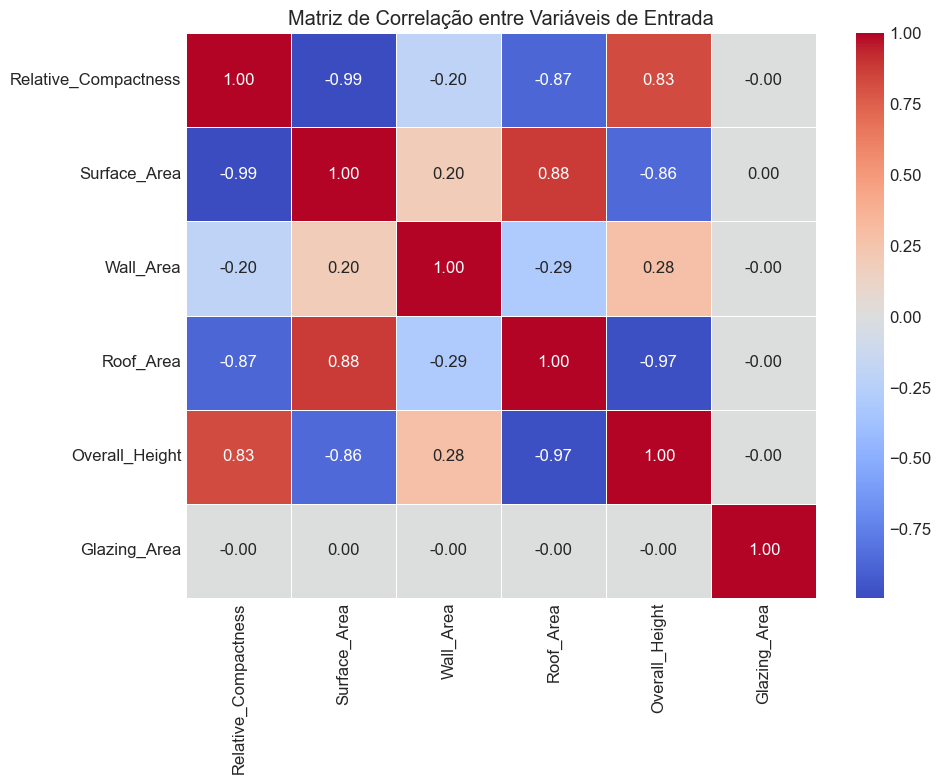


Pares de variáveis com alta correlação (>0.7):
   - Relative_Compactness e Surface_Area: 0.9919
   - Roof_Area e Overall_Height: 0.9725
   - Surface_Area e Roof_Area: 0.8807
   - Relative_Compactness e Roof_Area: 0.8688
   - Surface_Area e Overall_Height: 0.8581
   - Relative_Compactness e Overall_Height: 0.8277


In [112]:
# Análise alternativa de multicolinearidade (sem statsmodels)
print("\nAnálise de Multicolinearidade usando a matriz de correlação:")
input_corr = df[input_vars].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(input_corr, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title('Matriz de Correlação entre Variáveis de Entrada')
plt.tight_layout()
plt.savefig('../../reports/figures/input_correlation_matrix.png')
plt.show()

# Identificando pares de variáveis altamente correlacionadas
high_corr_pairs = []
for i in range(len(input_vars)):
    for j in range(i+1, len(input_vars)):
        corr = abs(input_corr.iloc[i, j])
        if corr > 0.7:  # Limiar de correlação alta
            high_corr_pairs.append((input_vars[i], input_vars[j], corr))

if high_corr_pairs:
    print("\nPares de variáveis com alta correlação (>0.7):")
    for var1, var2, corr in sorted(high_corr_pairs, key=lambda x: x[2], reverse=True):
        print(f"   - {var1} e {var2}: {corr:.4f}")
else:
    print("\nNenhum par de variáveis com correlação acima de 0.7 foi encontrado.")